# Set gpu

In [3]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
from segment_anything_hq import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

/home/rsr/anaconda3/envs/geosam/lib/python3.10/site-packages/segment_anything_hq/modeling/tiny_vit_sam.py:662: UserWarning: Overwriting tiny_vit_5m_224 in registry with segment_anything_hq.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/home/rsr/anaconda3/envs/geosam/lib/python3.10/site-packages/segment_anything_hq/modeling/tiny_vit_sam.py:662: UserWarning: Overwriting tiny_vit_11m_224 in registry with segment_anything_hq.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/home/rsr/anaconda3/envs/geosam/lib/python3.10/site-packages/segment_anything_hq/modeling/tiny_vit_sam.py:662: UserWarning: Overwriting tiny_vit_21m_224 in registry with segment_anything_hq.modeling.tiny_vit_sam.tiny_vit_21m_224. This is becaus

In [5]:
os.environ['CUDA_VISIBLE_DEVICES'] = "0"

# Visualize tools

## Show Masks on image

In [6]:
# 定义一个函数，名为 show_anns，它接受一个参数 anns，这个参数预期是一个注释列表。
def show_anns(anns):
    # 检查注释列表的长度，如果长度为0，即没有注释，函数直接返回，不执行任何操作。
    if len(anns) == 0:
        return
    # 对注释列表进行排序，排序依据是每个注释字典中的 'area' 键对应的值，按面积从大到小排序。
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    # 获取当前的 matplotlib 坐标轴对象。
    ax = plt.gca()
    # 设置坐标轴的自动缩放功能为关闭，这样我们可以手动控制图像的显示。
    ax.set_autoscale_on(False)
    # 创建一个新的图像数组 img，它的大小与第一个注释中的 'segmentation' 属性的形状相同。
    # 'segmentation' 属性预期是一个二维数组，表示分割区域的掩码。
    # img 的第三个维度是4，意味着它是一个带有透明度通道的RGBA图像。
    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    # 将图像数组的透明度通道全部设置为 0，这意味着图像的背景是不透明的。
    img[:,:,3] = 0
    # 遍历排序后的注释列表。
    for ann in sorted_anns:
        # 获取当前注释的分割掩码。
        m = ann['segmentation']
        # 随机生成一个颜色掩码，这是一个长度为3的数组，表示RGB颜色值，然后添加一个固定的透明度值0.35。
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        # 将生成的颜色掩码应用到图像数组的相应位置上，这些位置由分割掩码 m 指定。
        img[m] = color_mask
    # 使用 matplotlib 的 imshow 函数在当前坐标轴上显示图像。
    ax.imshow(img)

## Show Boxes on image

In [7]:
import matplotlib.patches as patches
def show_boxes(anns):
    if len(anns) == 0:
        return 
    # 对注释列表进行排序，排序依据是每个注释字典中的 'area' 键对应的值，按面积从大到小排序。
    sorted_anns = sorted(anns, key=(lambda x: x['predicted_iou']), reverse=True)
    # 获取当前的 matplotlib 坐标轴对象。
    ax = plt.gca()
    # 设置坐标轴的自动缩放功能为关闭，这样我们可以手动控制图像的显示。
    ax.set_autoscale_on(False)
    # 创建一个新的图像数组 img，它的大小与第一个注释中的 'segmentation' 属性的形状相同。
    # 'segmentation' 属性预期是一个二维数组，表示分割区域的掩码。
    # img 的第三个维度是4，意味着它是一个带有透明度通道的RGBA图像。
    # img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    # 将图像数组的透明度通道全部设置为 0，这意味着图像的背景是不透明的。
    # img[:,:,3] = 0
    for ann in sorted_anns[:30]:
        x, y, w, h = ann['bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=2, 
                                edgecolor='r', facecolor='none')
        ax.add_patch(rect)

# show the image

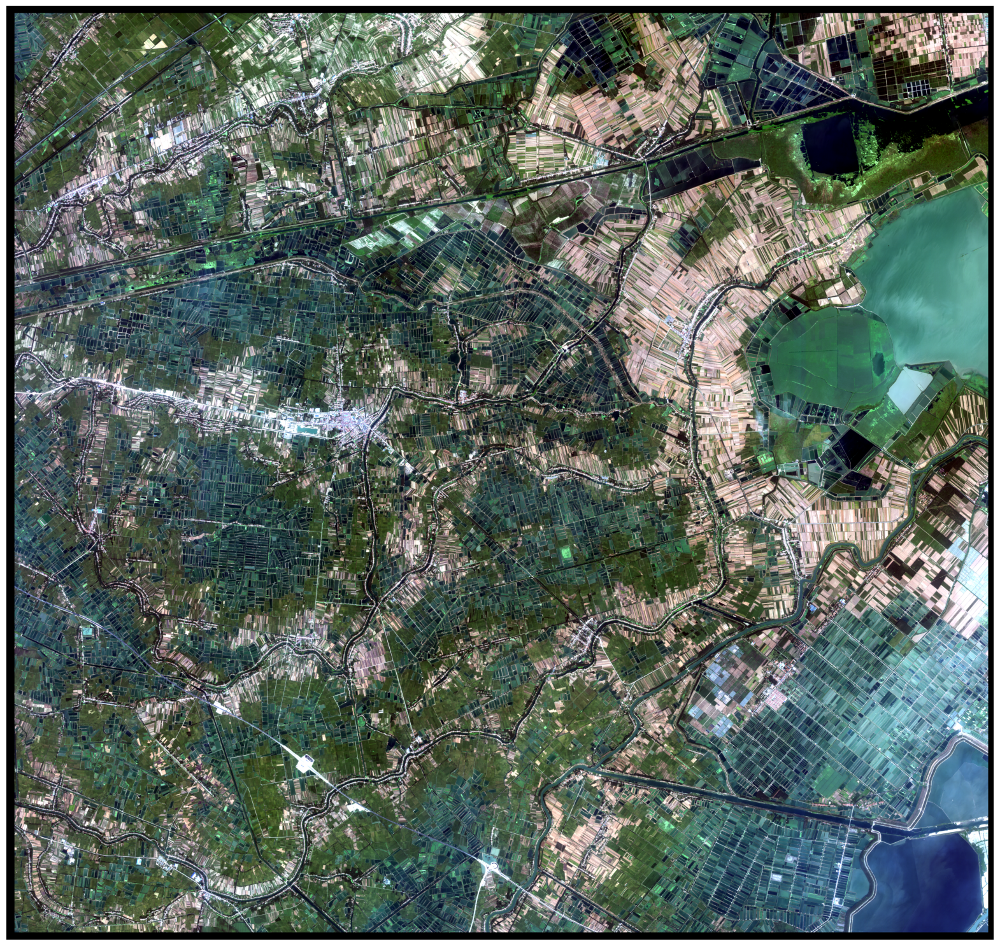

In [9]:
img_path = '/home/rsr/gyl/RS_DATASET/FBP/train/rgb_images/GF2_PMS1__L1A0001015649-MSS1.tif'
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

# Generate masks

## Gen 1

In [10]:
sam_checkpoint = "/home/rsr/gyl/RS_Code/sam-hq/pretrained_checkpoint/sam_hq_vit_b.pth"
model_type = "vit_b"
device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.8,
    stability_score_thresh=0.9,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

masks = mask_generator.generate(image)
len(masks)

<All keys matched successfully>


96

## Gen 2

In [ ]:
mask_generator2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.75,
    stability_score_thresh=0.85,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

masks2 = mask_generator2.generate(image, multimask_output=False)
len(masks2)

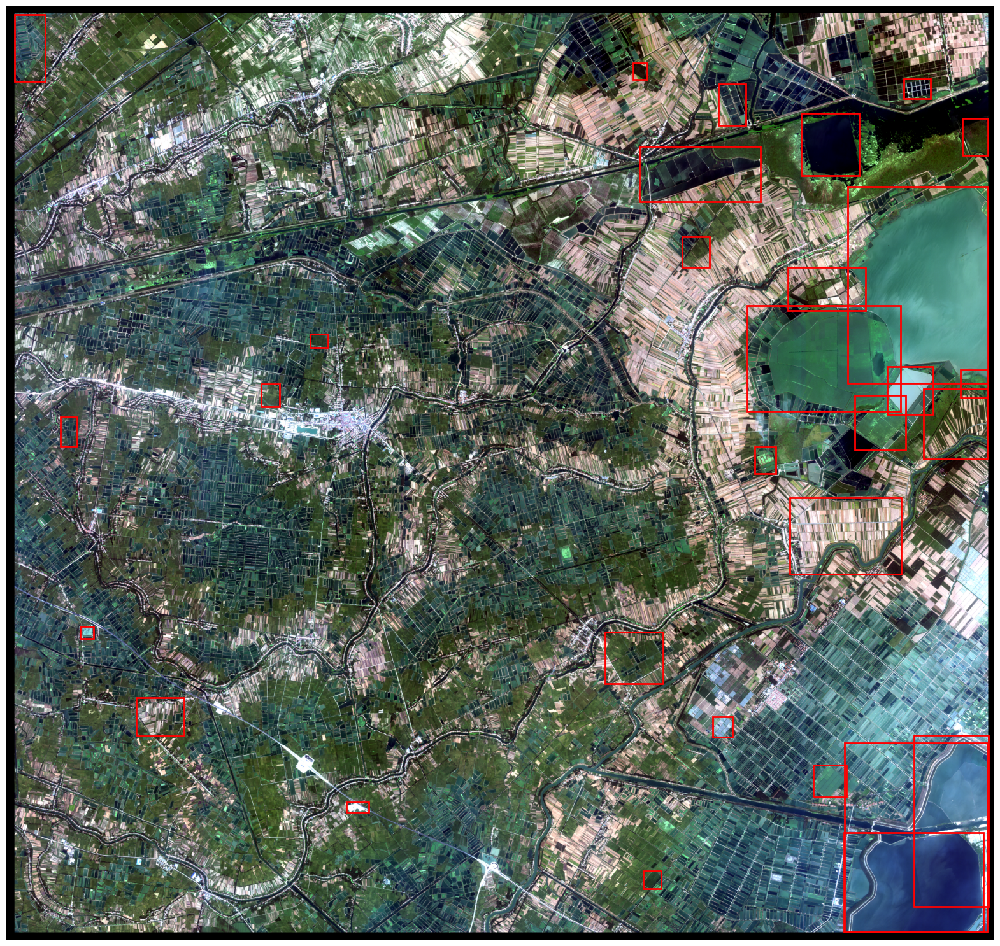

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(image)
# show_anns(masks)
show_boxes(masks)
plt.axis('off')
plt.show()